# 1. Import the Libraries

In [ ]:
#For numerical libraries
import numpy as np
#To handle data in the form of rows and columns
import pandas as pd
#importing seaborn for statistical plots
import seaborn as sns
#importing ploting libraries
import matplotlib.pyplot as plt
#styling figures
plt.rc('font',size=14)
sns.set(style='white')
sns.set(style='whitegrid',color_codes=True)
#To enable plotting graphs in Jupyter notebook
%matplotlib inline
#importing the feature scaling library
from sklearn.preprocessing import StandardScaler
#Import Sklearn package's data splitting function which is based on random function
from sklearn.model_selection import train_test_split
# Import Linear Regression, Ridge and Lasso machine learning library
from sklearn.linear_model import LinearRegression, Ridge, Lasso
# Import KNN Regressor machine learning library
from sklearn.neighbors import KNeighborsRegressor
# Import Decision Tree Regressor machine learning library
from sklearn.tree import DecisionTreeRegressor
# Import ensemble machine learning library
from sklearn.ensemble import (RandomForestRegressor, GradientBoostingRegressor,AdaBoostRegressor,BaggingRegressor)
# Import support vector regressor machine learning library
from sklearn.svm import SVR
#Import the metrics
from sklearn import metrics
#Import the Voting regressor for Ensemble
from sklearn.ensemble import VotingRegressor
# Import stats from scipy
from scipy import stats
# Import zscore for scaling
from scipy.stats import zscore
#importing the metrics
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
#importing the K fold
from sklearn.model_selection import KFold
#importing the cross validation score
from sklearn.model_selection import cross_val_score
#importing the preprocessing library
from sklearn import preprocessing
# importing the Polynomial features
from sklearn.preprocessing import PolynomialFeatures
#importing kmeans clustering library
from sklearn.cluster import KMeans
from sklearn.utils import resample

# 2. Load the dataset

In [ ]:
#reading the CSV file into pandas dataframe
concrete_df=pd.read_csv('concrete.csv')

In [ ]:
#Check top few records of the dataset
concrete_df.head()

,cement+scm,fa,ca+recycledAggregate,water,superplasticizer,silicaFume,steelFibre+Kenaf,7days,strength
0,700,682.4,904.6,127.19,17.5,105,10.5,88.20,126.0
1,700,682.4,904.6,127.19,17.5,105,10.5,98.00,140.0
2,700,682.4,904.6,127.19,17.5,105,10.5,89.95,128.5
3,700,682.4,904.6,127.19,17.5,105,10.5,86.80,124.0
4,700,682.4,904.6,127.19,17.5,105,10.5,88.20,126.0


In [ ]:
#Check the last few records of the dataset
concrete_df.tail()

,cement+scm,fa,ca+recycledAggregate,water,superplasticizer,silicaFume,steelFibre+Kenaf,7days,strength
448,813,903.0,953.0,318.0,12.0,3,3.000,49.091,70.13
449,813,903.0,953.0,353.0,12.0,3,3.016,43.358,61.94
450,813,903.0,953.0,371.0,12.0,3,3.025,39.921,57.03
451,813,903.0,953.0,388.0,12.0,3,3.033,33.271,47.53
452,813,898.0,908.0,183.0,5.0,3,3.000,46.690,66.70


# 3. Exploratory data quality report

## 3.1. Univariate analysis

### Data Types and Description

In [ ]:
#To show the detailed summary
concrete_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 453 entries, 0 to 452
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   cement+scm            453 non-null    int64  
 1   fa                    453 non-null    float64
 2   ca+recycledAggregate  453 non-null    float64
 3   water                 453 non-null    float64
 4   superplasticizer      453 non-null    float64
 5   silicaFume            453 non-null    int64  
 6   steelFibre+Kenaf      453 non-null    float64
 7   7days                 453 non-null    float64
 8   strength              453 non-null    float64
dtypes: float64(7), int64(2)
memory usage: 32.0 KB


In [ ]:
# Data types information
concrete_df.dtypes

cement+scm                int64
fa                      float64
ca+recycledAggregate    float64
water                   float64
superplasticizer        float64
silicaFume                int64
steelFibre+Kenaf        float64
7days                   float64
strength                float64
dtype: object

In [ ]:
#To get the shape
concrete_df.shape

(453, 9)

In [ ]:
#To get the columns name
concrete_df.columns

Index(['cement+scm', 'fa', 'ca+recycledAggregate', 'water', 'superplasticizer',
       'silicaFume', 'steelFibre+Kenaf', '7days', 'strength'],
      dtype='object')

In [ ]:
#Analyze the distribution of the dataset
concrete_df.describe().T

,count,mean,std,min,25%,50%,75%,max
cement+scm,453.0,590.549669,204.672943,143.000,441.00,700.0,703.0,1002.000
fa,453.0,689.925607,135.875433,402.000,611.70,685.4,708.0,903.000
ca+recycledAggregate,453.0,839.460706,226.312925,402.000,612.20,905.6,952.0,1184.000
water,453.0,161.309581,63.567728,47.190,128.19,152.0,181.0,388.000
superplasticizer,453.0,20.698102,17.528566,2.000,7.50,17.5,23.0,67.000
silicaFume,453.0,75.509934,101.684368,0.000,1.00,3.0,107.0,376.000
steelFibre+Kenaf,453.0,55.859179,90.725467,0.000,2.00,11.5,41.0,236.000
7days,453.0,81.030282,40.572467,29.134,42.14,89.6,99.4,172.466
strength,453.0,115.757545,57.960667,41.620,60.20,128.0,142.0,246.380


### Cement

#### Range of values observed

In [ ]:
print('Range of values: ', concrete_df['cement+scm'].max()-concrete_df['cement+scm'].min())

Range of values:  859


#### Central values

In [ ]:
print('Minimum age: ', concrete_df['cement+scm'].min())
print('Maximum age: ',concrete_df['cement+scm'].max())
print('Mean value: ', concrete_df['cement+scm'].mean())
print('Median value: ',concrete_df['cement+scm'].median())
print('Standard deviation: ', concrete_df['cement+scm'].std())

Minimum age:  143
Maximum age:  1002
Mean value:  590.5496688741722
Median value:  700.0
Standard deviation:  204.67294292936714


#### Quartiles

In [ ]:
Q1=concrete_df['cement+scm'].quantile(q=0.25)
Q3=concrete_df['cement+scm'].quantile(q=0.75)
print('1st Quartile (Q1) is: ', Q1)
print('3st Quartile (Q3) is: ', Q3)
print('Interquartile range (IQR) is ', stats.iqr(concrete_df['cement+scm']))

1st Quartile (Q1) is:  441.0
3st Quartile (Q3) is:  703.0
Interquartile range (IQR) is  262.0


#### Outlier detection from Interquartile range (IQR) in original data

In [ ]:
# IQR=Q3-Q1
#lower 1.5*IQR whisker i.e Q1-1.5*IQR
#upper 1.5*IQR whisker i.e Q3+1.5*IQR
L_outliers=Q1-1.5*(Q3-Q1)
U_outliers=Q3+1.5*(Q3-Q1)
print('Lower outliers in Cement: ', L_outliers)
print('Upper outliers in Cement: ', U_outliers)

Lower outliers in Cement:  48.0
Upper outliers in Cement:  1096.0


In [ ]:
print('Number of outliers in Cement : ', concrete_df[concrete_df['cement+scm']>586.4375]['cement+scm'].count())
print('Number of outliers in Cement : ', concrete_df[concrete_df['cement+scm']<-44.0625]['cement+scm'].count())
print('% of Outlier in Cement: ',round(concrete_df[concrete_df['cement+scm']>586.4375]['cement+scm'].count()*100/len(concrete_df)), '%')
print('% of Outlier in Cement: ',round(concrete_df[concrete_df['cement+scm']<-44.0625]['cement+scm'].count()*100/len(concrete_df)), '%')

Number of outliers in Cement :  254
Number of outliers in Cement :  0
% of Outlier in Cement:  56 %
% of Outlier in Cement:  0 %


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1599: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
<ipython-input-26-c079464a7f0b>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(concrete_df['cement+scm'],ax=ax2)


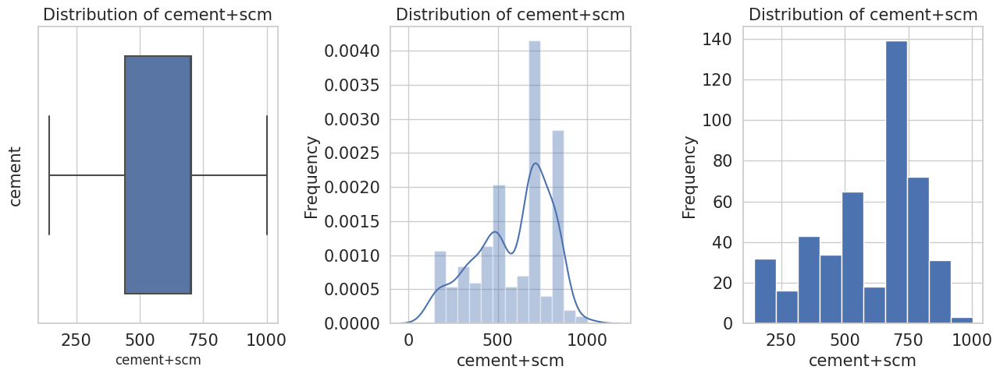

In [ ]:
fig, (ax1,ax2,ax3)=plt.subplots(1,3,figsize=(13,5))

#boxplot
sns.boxplot(x='cement+scm',data=concrete_df,orient='v',ax=ax1)
ax1.set_ylabel('cement', fontsize=15)
ax1.set_title('Distribution of cement+scm', fontsize=15)
ax1.tick_params(labelsize=15)

#distplot
sns.distplot(concrete_df['cement+scm'],ax=ax2)
ax2.set_xlabel('cement+scm', fontsize=15)
ax2.set_ylabel('Frequency', fontsize=15)
ax2.set_title('Distribution of cement+scm', fontsize=15)
ax2.tick_params(labelsize=15)

#histogram
ax3.hist(concrete_df['cement+scm'])
ax3.set_xlabel('cement+scm', fontsize=15)
ax3.set_ylabel('Frequency', fontsize=15)
ax3.set_title('Distribution of cement+scm', fontsize=15)
ax3.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

### Slag

#### Range of values observed

In [ ]:
print('Range of values: ', concrete_df['fa'].max()-concrete_df['fa'].min())

Range of values:  501.0


#### Central values

In [ ]:
print('Minimum FA: ', concrete_df['fa'].min())
print('Maximum FA: ',concrete_df['fa'].max())
print('Mean value: ', concrete_df['fa'].mean())
print('Median value: ',concrete_df['fa'].median())
print('Standard deviation: ', concrete_df['fa'].std())
print('Null values: ',concrete_df['fa'].isnull().any())

Minimum FA:  402.0
Maximum FA:  903.0
Mean value:  689.9256070640176
Median value:  685.4
Standard deviation:  135.87543328128243
Null values:  False


#### Quartiles

In [ ]:
Q1=concrete_df['fa'].quantile(q=0.25)
Q3=concrete_df['fa'].quantile(q=0.75)
print('1st Quartile (Q1) is: ', Q1)
print('3st Quartile (Q3) is: ', Q3)
print('Interquartile range (IQR) is ', stats.iqr(concrete_df['fa']))

1st Quartile (Q1) is:  611.7
3st Quartile (Q3) is:  708.0
Interquartile range (IQR) is  96.29999999999995


#### Outlier detection from Interquartile range (IQR)  in original data

In [ ]:
# IQR=Q3-Q1
#lower 1.5*IQR whisker i.e Q1-1.5*IQR
#upper 1.5*IQR whisker i.e Q3+1.5*IQR
L_outliers=Q1-1.5*(Q3-Q1)
U_outliers=Q3+1.5*(Q3-Q1)
print('Lower outliers in FA: ', L_outliers)
print('Upper outliers in FA: ', U_outliers)

Lower outliers in FA:  467.2500000000001
Upper outliers in FA:  852.4499999999999


In [ ]:
print('Number of outliers in FA upper : ', concrete_df[concrete_df['fa']>357.375]['fa'].count())
print('Number of outliers in FA lower : ', concrete_df[concrete_df['fa']<-214.425]['fa'].count())
print('% of Outlier in FA upper: ',round(concrete_df[concrete_df['fa']>357.375]['fa'].count()*100/len(concrete_df)), '%')
print('% of Outlier in FA lower: ',round(concrete_df[concrete_df['fa']<-214.425]['fa'].count()*100/len(concrete_df)), '%')

Number of outliers in FA upper :  453
Number of outliers in FA lower :  0
% of Outlier in FA upper:  100 %
% of Outlier in FA lower:  0 %


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1599: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
<ipython-input-32-3d4cb5d93a9c>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(concrete_df['fa'],ax=ax2)


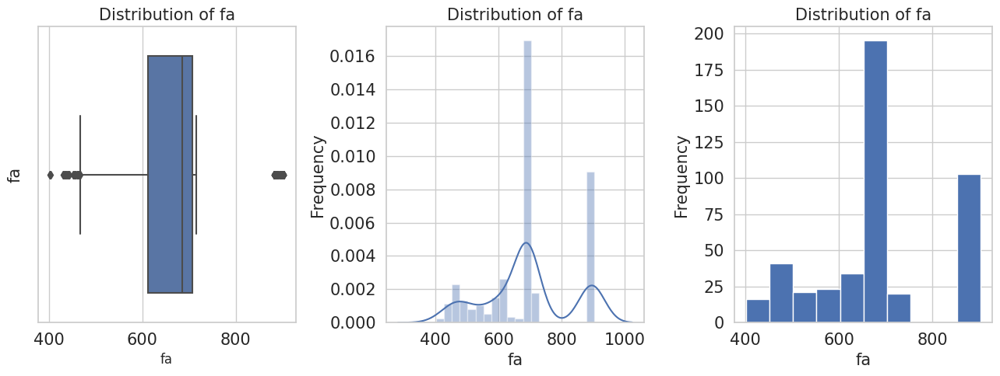

In [ ]:
fig, (ax1,ax2,ax3)=plt.subplots(1,3,figsize=(13,5))

#boxplot
sns.boxplot(x='fa',data=concrete_df,orient='v',ax=ax1)
ax1.set_ylabel('fa', fontsize=15)
ax1.set_title('Distribution of fa', fontsize=15)
ax1.tick_params(labelsize=15)

#distplot
sns.distplot(concrete_df['fa'],ax=ax2)
ax2.set_xlabel('fa', fontsize=15)
ax2.set_ylabel('Frequency', fontsize=15)
ax2.set_title('Distribution of fa', fontsize=15)
ax2.tick_params(labelsize=15)

#histogram
ax3.hist(concrete_df['fa'])
ax3.set_xlabel('fa', fontsize=15)
ax3.set_ylabel('Frequency', fontsize=15)
ax3.set_title('Distribution of fa', fontsize=15)
ax3.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

### Ash

#### Range of values observed

In [ ]:
print('Range of values: ', concrete_df['ca+recycledAggregate'].max()-concrete_df['ca+recycledAggregate'].min())

Range of values:  782.0


#### Central values

In [ ]:
print('Minimum CA: ', concrete_df['ca+recycledAggregate'].min())
print('Maximum CA: ',concrete_df['ca+recycledAggregate'].max())
print('Mean value: ', concrete_df['ca+recycledAggregate'].mean())
print('Median value: ',concrete_df['ca+recycledAggregate'].median())
print('Standard deviation: ', concrete_df['ca+recycledAggregate'].std())

Minimum CA:  402.0
Maximum CA:  1184.0
Mean value:  839.4607064017661
Median value:  905.6
Standard deviation:  226.3129247585613


#### Quartiles

In [ ]:
Q1=concrete_df['ca+recycledAggregate'].quantile(q=0.25)
Q3=concrete_df['ca+recycledAggregate'].quantile(q=0.75)
print('1st Quartile (Q1) is: ', Q1)
print('3st Quartile (Q3) is: ', Q3)
print('Interquartile range (IQR) is ', stats.iqr(concrete_df['ca+recycledAggregate']))

1st Quartile (Q1) is:  612.2
3st Quartile (Q3) is:  952.0
Interquartile range (IQR) is  339.79999999999995


#### Outlier detection from Interquartile range (IQR)  in original data

In [ ]:
# IQR=Q3-Q1
#lower 1.5*IQR whisker i.e Q1-1.5*IQR
#upper 1.5*IQR whisker i.e Q3+1.5*IQR
L_outliers=Q1-1.5*(Q3-Q1)
U_outliers=Q3+1.5*(Q3-Q1)
print('Lower outliers in CA: ', L_outliers)
print('Upper outliers in CA: ', U_outliers)

Lower outliers in CA:  102.50000000000011
Upper outliers in CA:  1461.6999999999998


In [ ]:
print('Number of outliers in CA upper : ', concrete_df[concrete_df['ca+recycledAggregate']>295.75]['ca+recycledAggregate'].count())
print('Number of outliers in CA lower : ', concrete_df[concrete_df['ca+recycledAggregate']<-177.45]['ca+recycledAggregate'].count())
print('% of Outlier in CA upper: ',round(concrete_df[concrete_df['ca+recycledAggregate']>295.75]['ca+recycledAggregate'].count()*100/len(concrete_df)), '%')
print('% of Outlier in CA lower: ',round(concrete_df[concrete_df['ca+recycledAggregate']<-177.45]['ca+recycledAggregate'].count()*100/len(concrete_df)), '%')

Number of outliers in CA upper :  453
Number of outliers in CA lower :  0
% of Outlier in CA upper:  100 %
% of Outlier in CA lower:  0 %


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1599: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
<ipython-input-38-eb6892d3af84>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(concrete_df['ca+recycledAggregate'],ax=ax2)


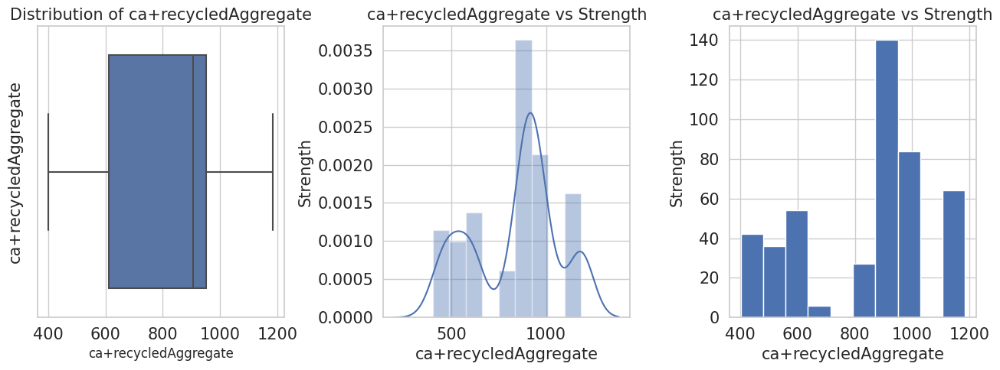

In [ ]:
fig, (ax1,ax2,ax3)=plt.subplots(1,3,figsize=(13,5))

#boxplot
sns.boxplot(x='ca+recycledAggregate',data=concrete_df,orient='v',ax=ax1)
ax1.set_ylabel('ca+recycledAggregate', fontsize=15)
ax1.set_title('Distribution of ca+recycledAggregate', fontsize=15)
ax1.tick_params(labelsize=15)

#distplot
sns.distplot(concrete_df['ca+recycledAggregate'],ax=ax2)
ax2.set_xlabel('ca+recycledAggregate', fontsize=15)
ax2.set_ylabel('Strength', fontsize=15)
ax2.set_title('ca+recycledAggregate vs Strength', fontsize=15)
ax2.tick_params(labelsize=15)

#histogram
ax3.hist(concrete_df['ca+recycledAggregate'])
ax3.set_xlabel('ca+recycledAggregate', fontsize=15)
ax3.set_ylabel('Strength', fontsize=15)
ax3.set_title('ca+recycledAggregate vs Strength', fontsize=15)
ax3.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

### Water

#### Range of values observed

In [ ]:
print('Range of values: ', concrete_df['water'].max()-concrete_df['water'].min())

Range of values:  340.81


#### Central values

In [ ]:
print('Minimum Water: ', concrete_df['water'].min())
print('Maximum water: ',concrete_df['water'].max())
print('Mean value: ', concrete_df['water'].mean())
print('Median value: ',concrete_df['water'].median())
print('Standard deviation: ', concrete_df['water'].std())
print('Null values: ',concrete_df['water'].isnull().any())

Minimum Water:  47.19
Maximum water:  388.0
Mean value:  161.30958057395142
Median value:  152.0
Standard deviation:  63.567727891190756
Null values:  False


#### Quartiles

In [ ]:
Q1=concrete_df['water'].quantile(q=0.25)
Q3=concrete_df['water'].quantile(q=0.75)
print('1st Quartile (Q1) is: ', Q1)
print('3st Quartile (Q3) is: ', Q3)
print('Interquartile range (IQR) is ', stats.iqr(concrete_df['water']))

1st Quartile (Q1) is:  128.19
3st Quartile (Q3) is:  181.0
Interquartile range (IQR) is  52.81


#### Outlier detection from Interquartile range (IQR)  in original data

In [ ]:
# IQR=Q3-Q1
#lower 1.5*IQR whisker i.e Q1-1.5*IQR
#upper 1.5*IQR whisker i.e Q3+1.5*IQR
L_outliers=Q1-1.5*(Q3-Q1)
U_outliers=Q3+1.5*(Q3-Q1)
print('Lower outliers in Water: ', L_outliers)
print('Upper outliers in Water: ', U_outliers)

Lower outliers in Water:  48.974999999999994
Upper outliers in Water:  260.21500000000003


In [ ]:
print('Number of outliers in Water upper : ', concrete_df[concrete_df['water']>232.65]['water'].count())
print('Number of outliers in Water lower : ', concrete_df[concrete_df['water']<124.25]['water'].count())
print('% of Outlier in Water upper: ',round(concrete_df[concrete_df['water']>232.65]['water'].count()*100/len(concrete_df)), '%')
print('% of Outlier in Water lower: ',round(concrete_df[concrete_df['water']<124.25]['water'].count()*100/len(concrete_df)), '%')

Number of outliers in Water upper :  44
Number of outliers in Water lower :  64
% of Outlier in Water upper:  10 %
% of Outlier in Water lower:  14 %


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1599: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
<ipython-input-44-869ed933c7f1>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(concrete_df['water'],ax=ax2)


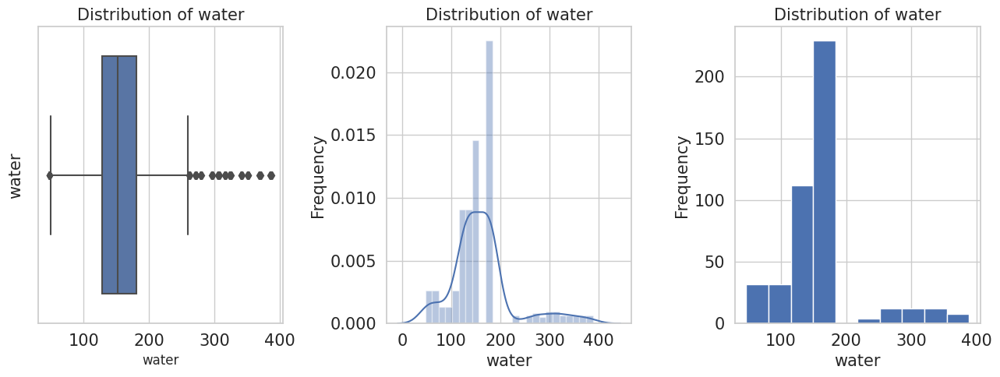

In [ ]:
fig, (ax1,ax2,ax3)=plt.subplots(1,3,figsize=(13,5))

#boxplot
sns.boxplot(x='water',data=concrete_df,orient='v',ax=ax1)
ax1.set_ylabel('water', fontsize=15)
ax1.set_title('Distribution of water', fontsize=15)
ax1.tick_params(labelsize=15)

#distplot
sns.distplot(concrete_df['water'],ax=ax2)
ax2.set_xlabel('water', fontsize=15)
ax2.set_ylabel('Frequency', fontsize=15)
ax2.set_title('Distribution of water', fontsize=15)
ax2.tick_params(labelsize=15)

#histogram
ax3.hist(concrete_df['water'])
ax3.set_xlabel('water', fontsize=15)
ax3.set_ylabel('Frequency', fontsize=15)
ax3.set_title('Distribution of water', fontsize=15)
ax3.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

### Superplastic

#### Range of values observed

In [ ]:
print('Range of values: ', concrete_df['superplasticizer'].max()-concrete_df['superplasticizer'].min())

Range of values:  65.0


#### Central values

In [ ]:
print('Minimum 7 Days: ', concrete_df['superplasticizer'].min())
print('Maximum 7 Days: ',concrete_df['superplasticizer'].max())
print('Mean value: ', concrete_df['superplasticizer'].mean())
print('Median value: ',concrete_df['superplasticizer'].median())
print('Standard deviation: ', concrete_df['superplasticizer'].std())
print('Null values: ',concrete_df['superplasticizer'].isnull().any())

Minimum 7 Days:  2.0
Maximum 7 Days:  67.0
Mean value:  20.69810154525386
Median value:  17.5
Standard deviation:  17.528565583987287
Null values:  False


#### Quartiles

In [ ]:
Q1=concrete_df['superplasticizer'].quantile(q=0.25)
Q3=concrete_df['superplasticizer'].quantile(q=0.75)
print('1st Quartile (Q1) is: ', Q1)
print('3st Quartile (Q3) is: ', Q3)
print('Interquartile range (IQR) is ', stats.iqr(concrete_df['superplasticizer']))

1st Quartile (Q1) is:  7.5
3st Quartile (Q3) is:  23.0
Interquartile range (IQR) is  15.5


#### Outlier detection from Interquartile range (IQR)  in original data

In [ ]:
# IQR=Q3-Q1
#lower 1.5*IQR whisker i.e Q1-1.5*IQR
#upper 1.5*IQR whisker i.e Q3+1.5*IQR
L_outliers=Q1-1.5*(Q3-Q1)
U_outliers=Q3+1.5*(Q3-Q1)
print('Lower outliers in 7 Days: ', L_outliers)
print('Upper outliers in 7 Days: ', U_outliers)

Lower outliers in 7 Days:  -15.75
Upper outliers in 7 Days:  46.25


In [ ]:
print('Number of outliers in 7 Days upper : ', concrete_df[concrete_df['superplasticizer']>25.5]['superplasticizer'].count())
print('Number of outliers in 7 Days lower : ', concrete_df[concrete_df['superplasticizer']<-15.3]['superplasticizer'].count())
print('% of Outlier in 7 Days upper: ',round(concrete_df[concrete_df['superplasticizer']>25.5]['superplasticizer'].count()*100/len(concrete_df)), '%')
print('% of Outlier in 7 Days lower: ',round(concrete_df[concrete_df['superplasticizer']<-15.3]['superplasticizer'].count()*100/len(concrete_df)), '%')

Number of outliers in 7 Days upper :  90
Number of outliers in 7 Days lower :  0
% of Outlier in 7 Days upper:  20 %
% of Outlier in 7 Days lower:  0 %


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1599: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
<ipython-input-50-307e9a2528c6>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(concrete_df['superplasticizer'],ax=ax2)


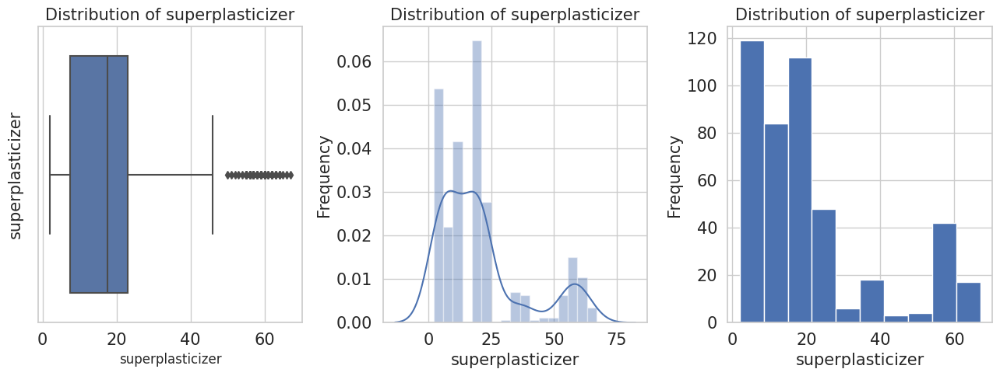

In [ ]:
fig, (ax1,ax2,ax3)=plt.subplots(1,3,figsize=(13,5))

#boxplot
sns.boxplot(x='superplasticizer',data=concrete_df,orient='v',ax=ax1)
ax1.set_ylabel('superplasticizer', fontsize=15)
ax1.set_title('Distribution of superplasticizer', fontsize=15)
ax1.tick_params(labelsize=15)

#distplot
sns.distplot(concrete_df['superplasticizer'],ax=ax2)
ax2.set_xlabel('superplasticizer', fontsize=15)
ax2.set_ylabel('Frequency', fontsize=15)
ax2.set_title('Distribution of superplasticizer', fontsize=15)
ax2.tick_params(labelsize=15)

#histogram
ax3.hist(concrete_df['superplasticizer'])
ax3.set_xlabel('superplasticizer', fontsize=15)
ax3.set_ylabel('Frequency', fontsize=15)
ax3.set_title('Distribution of superplasticizer', fontsize=15)
ax3.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

### Coarseagg

#### Range of values observed

In [ ]:
print('Range of values: ', concrete_df['silicaFume'].max()-concrete_df['silicaFume'].min())

Range of values:  376


#### Central values

In [ ]:
print('Minimum value: ', concrete_df['silicaFume'].min())
print('Maximum value: ',concrete_df['silicaFume'].max())
print('Mean value: ', concrete_df['silicaFume'].mean())
print('Median value: ',concrete_df['silicaFume'].median())
print('Standard deviation: ', concrete_df['silicaFume'].std())
print('Null values: ',concrete_df['silicaFume'].isnull().any())

Minimum value:  0
Maximum value:  376
Mean value:  75.50993377483444
Median value:  3.0
Standard deviation:  101.68436768348563
Null values:  False


#### Quartiles

In [ ]:
Q1=concrete_df['silicaFume'].quantile(q=0.25)
Q3=concrete_df['silicaFume'].quantile(q=0.75)
print('1st Quartile (Q1) is: ', Q1)
print('3st Quartile (Q3) is: ', Q3)
print('Interquartile range (IQR) is ', stats.iqr(concrete_df['silicaFume']))

1st Quartile (Q1) is:  1.0
3st Quartile (Q3) is:  107.0
Interquartile range (IQR) is  106.0


#### Outlier detection from Interquartile range (IQR)  in original data

In [ ]:
# IQR=Q3-Q1
#lower 1.5*IQR whisker i.e Q1-1.5*IQR
#upper 1.5*IQR whisker i.e Q3+1.5*IQR
L_outliers=Q1-1.5*(Q3-Q1)
U_outliers=Q3+1.5*(Q3-Q1)
print('Lower outliers in 14 Days: ', L_outliers)
print('Upper outliers in 14 Days: ', U_outliers)

Lower outliers in 14 Days:  -158.0
Upper outliers in 14 Days:  266.0


In [ ]:
print('Number of outliers in 14 Days upper : ', concrete_df[concrete_df['silicaFume']>1175.5]['silicaFume'].count())
print('Number of outliers in 14 Days lower : ', concrete_df[concrete_df['silicaFume']<785.9]['silicaFume'].count())
print('% of Outlier in 14 Days upper: ',round(concrete_df[concrete_df['silicaFume']>1175.5]['silicaFume'].count()*100/len(concrete_df)), '%')
print('% of Outlier in 14 Days lower: ',round(concrete_df[concrete_df['silicaFume']<785.9]['silicaFume'].count()*100/len(concrete_df)), '%')

Number of outliers in 14 Days upper :  0
Number of outliers in 14 Days lower :  453
% of Outlier in 14 Days upper:  0 %
% of Outlier in 14 Days lower:  100 %


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1599: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
<ipython-input-56-d4dd58f48220>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(concrete_df['silicaFume'],ax=ax2)


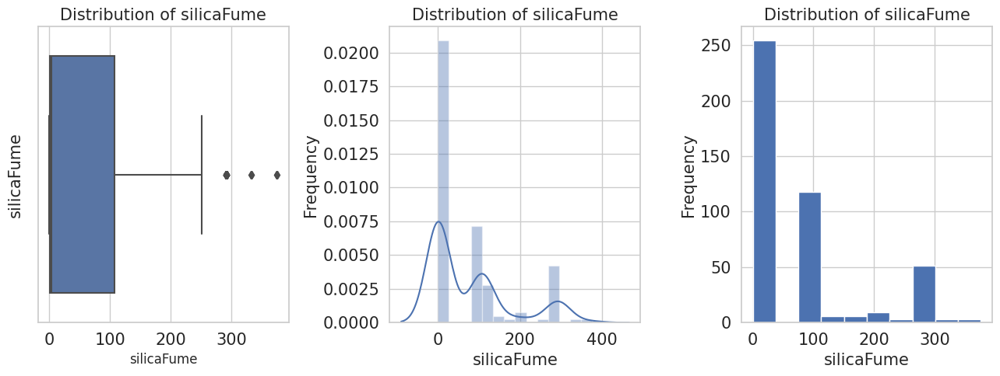

In [ ]:
fig, (ax1,ax2,ax3)=plt.subplots(1,3,figsize=(13,5))

#boxplot
sns.boxplot(x='silicaFume',data=concrete_df,orient='v',ax=ax1)
ax1.set_ylabel('silicaFume', fontsize=15)
ax1.set_title('Distribution of silicaFume', fontsize=15)
ax1.tick_params(labelsize=15)

#distplot
sns.distplot(concrete_df['silicaFume'],ax=ax2)
ax2.set_xlabel('silicaFume', fontsize=15)
ax2.set_ylabel('Frequency', fontsize=15)
ax2.set_title('Distribution of silicaFume', fontsize=15)
ax2.tick_params(labelsize=15)

#histogram
ax3.hist(concrete_df['silicaFume'])
ax3.set_xlabel('silicaFume', fontsize=15)
ax3.set_ylabel('Frequency', fontsize=15)
ax3.set_title('Distribution of silicaFume', fontsize=15)
ax3.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

### Fineagg

#### Range of values observed

In [ ]:
print('Range of values: ', concrete_df['steelFibre+Kenaf'].max()-concrete_df['steelFibre+Kenaf'].min())

Range of values:  236.0


#### Central values

In [ ]:
print('Minimum value: ', concrete_df['steelFibre+Kenaf'].min())
print('Maximum value: ',concrete_df['steelFibre+Kenaf'].max())
print('Mean value: ', concrete_df['steelFibre+Kenaf'].mean())
print('Median value: ',concrete_df['steelFibre+Kenaf'].median())
print('Standard deviation: ', concrete_df['steelFibre+Kenaf'].std())
print('Null values: ',concrete_df['steelFibre+Kenaf'].isnull().any())

Minimum value:  0.0
Maximum value:  236.0
Mean value:  55.85917880794702
Median value:  11.5
Standard deviation:  90.72546709491023
Null values:  False


#### Quartiles

In [ ]:
Q1=concrete_df['steelFibre+Kenaf'].quantile(q=0.25)
Q3=concrete_df['steelFibre+Kenaf'].quantile(q=0.75)
print('1st Quartile (Q1) is: ', Q1)
print('3st Quartile (Q3) is: ', Q3)
print('Interquartile range (IQR) is ', stats.iqr(concrete_df['steelFibre+Kenaf']))

1st Quartile (Q1) is:  2.0
3st Quartile (Q3) is:  41.0
Interquartile range (IQR) is  39.0


#### Outlier detection from Interquartile range (IQR)  in original data

In [ ]:
# IQR=Q3-Q1
#lower 1.5*IQR whisker i.e Q1-1.5*IQR
#upper 1.5*IQR whisker i.e Q3+1.5*IQR
L_outliers=Q1-1.5*(Q3-Q1)
U_outliers=Q3+1.5*(Q3-Q1)
print('Lower outliers in 28 Days: ', L_outliers)
print('Upper outliers in 28 Days: ', U_outliers)

Lower outliers in 28 Days:  -56.5
Upper outliers in 28 Days:  99.5


In [ ]:
print('Number of outliers in 28 Days upper : ', concrete_df[concrete_df['steelFibre+Kenaf']>963.575]['steelFibre+Kenaf'].count())
print('Number of outliers in 28 Days lower : ', concrete_df[concrete_df['steelFibre+Kenaf']<591.37]['steelFibre+Kenaf'].count())
print('% of Outlier in 28 Days upper: ',round(concrete_df[concrete_df['steelFibre+Kenaf']>963.575]['steelFibre+Kenaf'].count()*100/len(concrete_df)), '%')
print('% of Outlier in 28 Days lower: ',round(concrete_df[concrete_df['steelFibre+Kenaf']<591.37]['steelFibre+Kenaf'].count()*100/len(concrete_df)), '%')

Number of outliers in 28 Days upper :  0
Number of outliers in 28 Days lower :  453
% of Outlier in 28 Days upper:  0 %
% of Outlier in 28 Days lower:  100 %


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1599: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
<ipython-input-62-3ed088eabe0b>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(concrete_df['steelFibre+Kenaf'],ax=ax2)


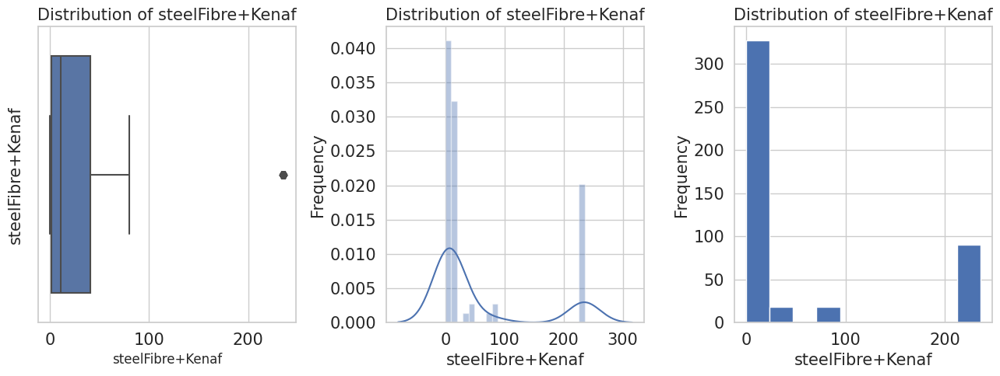

In [ ]:
fig, (ax1,ax2,ax3)=plt.subplots(1,3,figsize=(13,5))

#boxplot
sns.boxplot(x='steelFibre+Kenaf',data=concrete_df,orient='v',ax=ax1)
ax1.set_ylabel('steelFibre+Kenaf', fontsize=15)
ax1.set_title('Distribution of steelFibre+Kenaf', fontsize=15)
ax1.tick_params(labelsize=15)

#distplot
sns.distplot(concrete_df['steelFibre+Kenaf'],ax=ax2)
ax2.set_xlabel('steelFibre+Kenaf', fontsize=15)
ax2.set_ylabel('Frequency', fontsize=15)
ax2.set_title('Distribution of steelFibre+Kenaf', fontsize=15)
ax2.tick_params(labelsize=15)

#histogram
ax3.hist(concrete_df['steelFibre+Kenaf'])
ax3.set_xlabel('steelFibre+Kenaf', fontsize=15)
ax3.set_ylabel('Frequency', fontsize=15)
ax3.set_title('Distribution of steelFibre+Kenaf', fontsize=15)
ax3.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

### Age

#### Range of values observed

In [ ]:
print('Range of values: ', concrete_df['7days'].max()-concrete_df['7days'].min())

Range of values:  143.332


#### Central values

In [ ]:
print('Minimum age: ', concrete_df['7days'].min())
print('Maximum age: ',concrete_df['7days'].max())
print('Mean value: ', concrete_df['7days'].mean())
print('Median value: ',concrete_df['7days'].median())
print('Standard deviation: ', concrete_df['7days'].std())
print('Null values: ',concrete_df['7days'].isnull().any())

Minimum age:  29.134
Maximum age:  172.466
Mean value:  81.03028167770418
Median value:  89.6
Standard deviation:  40.5724669717676
Null values:  False


#### Quartiles

In [ ]:
Q1=concrete_df['7days'].quantile(q=0.25)
Q3=concrete_df['7days'].quantile(q=0.75)
print('1st Quartile (Q1) is: ', Q1)
print('3st Quartile (Q3) is: ', Q3)
print('Interquartile range (IQR) is ', stats.iqr(concrete_df['7days']))

1st Quartile (Q1) is:  42.14
3st Quartile (Q3) is:  99.4
Interquartile range (IQR) is  57.260000000000005


#### Outlier detection from Interquartile range (IQR)  in original data

In [ ]:
# IQR=Q3-Q1
#lower 1.5*IQR whisker i.e Q1-1.5*IQR
#upper 1.5*IQR whisker i.e Q3+1.5*IQR
L_outliers=Q1-1.5*(Q3-Q1)
U_outliers=Q3+1.5*(Q3-Q1)
print('Lower outliers in 56 Days: ', L_outliers)
print('Upper outliers in 56 Days: ', U_outliers)

Lower outliers in 56 Days:  -43.750000000000014
Upper outliers in 56 Days:  185.29000000000002


In [ ]:
print('Number of outliers in 56 Days upper : ', concrete_df[concrete_df['7days']>129.5]['7days'].count())
print('Number of outliers in 56 Days lower : ', concrete_df[concrete_df['7days']<-66.5]['7days'].count())
print('% of Outlier in 56 Days upper: ',round(concrete_df[concrete_df['7days']>129.5]['7days'].count()*100/len(concrete_df)), '%')
print('% of Outlier in 56 Days lower: ',round(concrete_df[concrete_df['7days']<-66.5]['7days'].count()*100/len(concrete_df)), '%')

Number of outliers in 56 Days upper :  75
Number of outliers in 56 Days lower :  0
% of Outlier in 56 Days upper:  17 %
% of Outlier in 56 Days lower:  0 %


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1599: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
<ipython-input-68-2a03f50ddf90>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(concrete_df['7days'],ax=ax2)


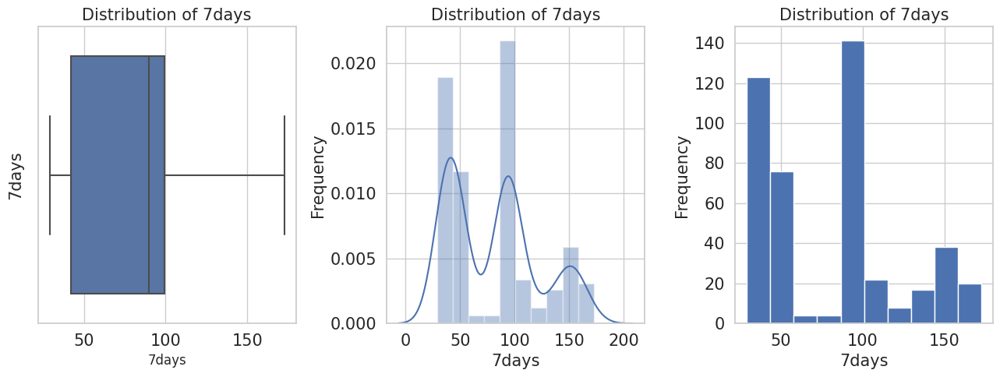

In [ ]:
fig, (ax1,ax2,ax3)=plt.subplots(1,3,figsize=(13,5))

#boxplot
sns.boxplot(x='7days',data=concrete_df,orient='v',ax=ax1)
ax1.set_ylabel('7days', fontsize=15)
ax1.set_title('Distribution of 7days', fontsize=15)
ax1.tick_params(labelsize=15)

#distplot
sns.distplot(concrete_df['7days'],ax=ax2)
ax2.set_xlabel('7days', fontsize=15)
ax2.set_ylabel('Frequency', fontsize=15)
ax2.set_title('Distribution of 7days', fontsize=15)
ax2.tick_params(labelsize=15)

#histogram
ax3.hist(concrete_df['7days'])
ax3.set_xlabel('7days', fontsize=15)
ax3.set_ylabel('Frequency', fontsize=15)
ax3.set_title('Distribution of 7days', fontsize=15)
ax3.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

## 3.2. Multivariate Analysis

<ipython-input-69-1a501ad14af1>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(concrete_df['cement+scm'],ax=ax2[0][0])
<ipython-input-69-1a501ad14af1>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(concrete_df['fa'],ax=ax2[0][1])
<ipython-input-69-1a501ad14af1>:5: UserWarning: 

`distplot` i

<Axes: xlabel='strength', ylabel='Density'>

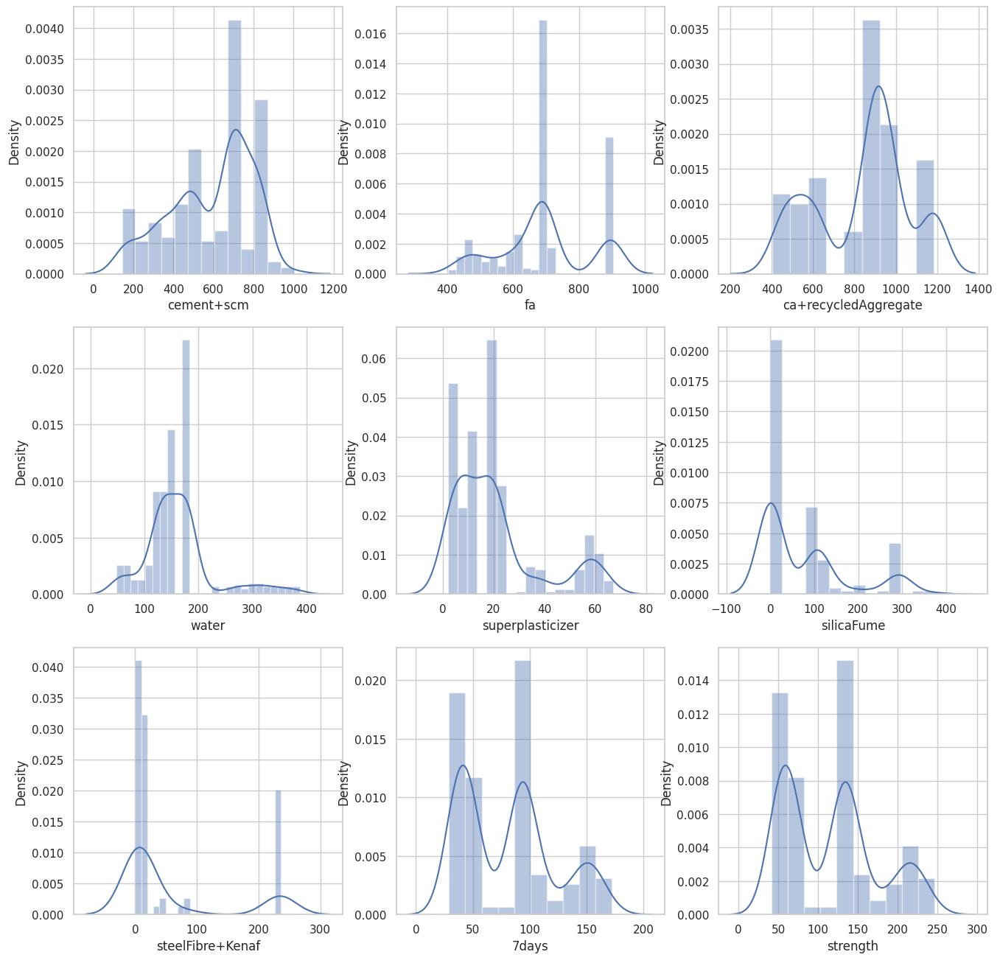

In [ ]:
# Distplot
fig, ax2 = plt.subplots(3, 3, figsize=(16, 16))
sns.distplot(concrete_df['cement+scm'],ax=ax2[0][0])
sns.distplot(concrete_df['fa'],ax=ax2[0][1])
sns.distplot(concrete_df['ca+recycledAggregate'],ax=ax2[0][2])
sns.distplot(concrete_df['water'],ax=ax2[1][0])
sns.distplot(concrete_df['superplasticizer'],ax=ax2[1][1])
sns.distplot(concrete_df['silicaFume'],ax=ax2[1][2])
sns.distplot(concrete_df['steelFibre+Kenaf'],ax=ax2[2][0])
sns.distplot(concrete_df['7days'],ax=ax2[2][1])
sns.distplot(concrete_df['strength'],ax=ax2[2][2])

array([[<Axes: title={'center': 'cement+scm'}>,
        <Axes: title={'center': 'fa'}>,
        <Axes: title={'center': 'ca+recycledAggregate'}>],
       [<Axes: title={'center': 'water'}>,
        <Axes: title={'center': 'superplasticizer'}>,
        <Axes: title={'center': 'silicaFume'}>],
       [<Axes: title={'center': 'steelFibre+Kenaf'}>,
        <Axes: title={'center': '7days'}>,
        <Axes: title={'center': 'strength'}>]], dtype=object)

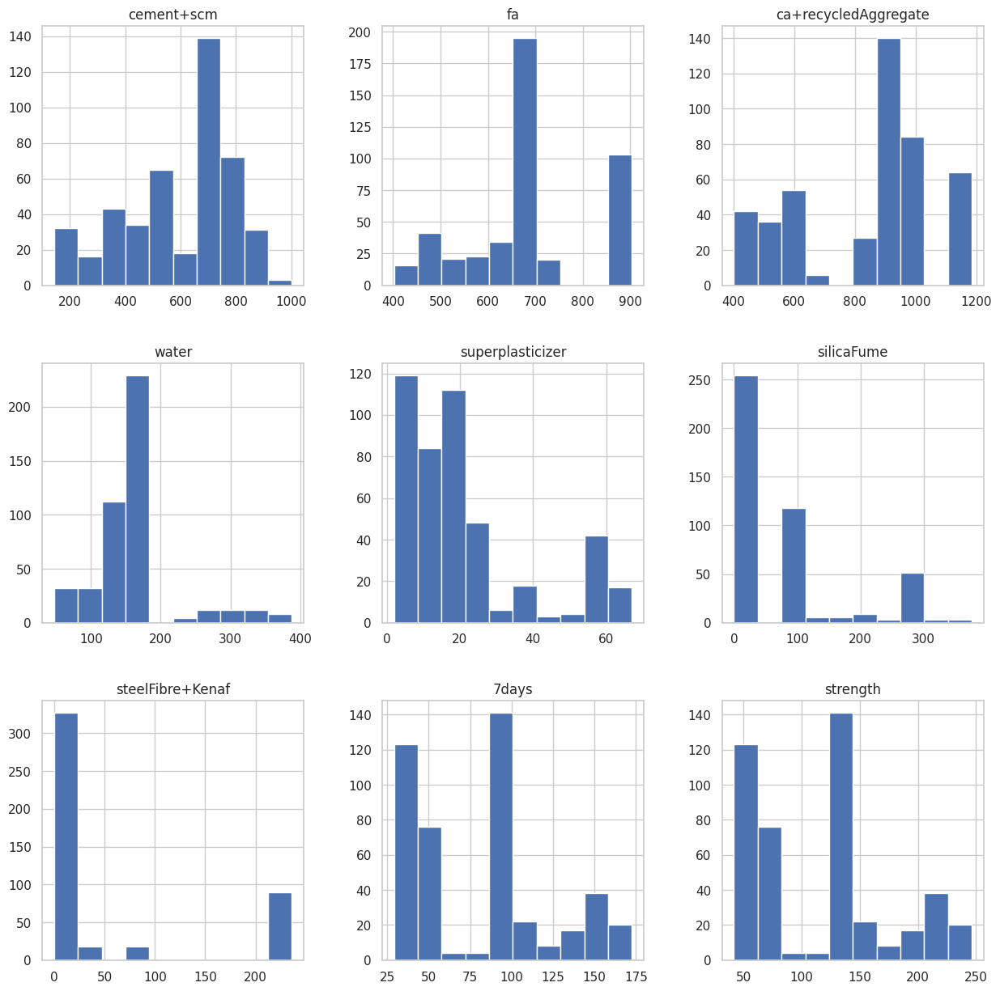

In [ ]:
# Histogram
concrete_df.hist(figsize=(15,15))

* It is also giving the same information like distance plot.

In [ ]:
# pairplot- plot density curve instead of histogram in diagonal
sns.set(rc={"figure.dpi":490, 'savefig.dpi':490})
sns.set_context('notebook')
g = sns.pairplot(concrete_df, diag_kind='kde')



In [ ]:
# corrlation matrix
cor=concrete_df.corr()
cor

,cement+scm,fa,ca+recycledAggregate,water,superplasticizer,silicaFume,steelFibre+Kenaf,7days,strength
cement+scm,1.000000,-0.118854,-0.450280,0.442859,0.336669,0.242781,0.092368,0.438777,0.438777
fa,-0.118854,1.000000,0.625115,0.467529,-0.827307,-0.751525,-0.660775,-0.802512,-0.802512
ca+recycledAggregate,-0.450280,0.625115,1.000000,-0.164501,-0.860423,-0.680402,-0.751392,-0.846373,-0.846373
water,0.442859,0.467529,-0.164501,1.000000,-0.051839,-0.200990,-0.085971,-0.147171,-0.147171
superplasticizer,0.336669,-0.827307,-0.860423,-0.051839,1.000000,0.913069,0.865685,0.906612,0.906612
silicaFume,0.242781,-0.751525,-0.680402,-0.200990,0.913069,1.000000,0.814048,0.844972,0.844972
steelFibre+Kenaf,0.092368,-0.660775,-0.751392,-0.085971,0.865685,0.814048,1.000000,0.764119,0.764119
7days,0.438777,-0.802512,-0.846373,-0.147171,0.906612,0.844972,0.764119,1.000000,1.000000
strength,0.438777,-0.802512,-0.846373,-0.147171,0.906612,0.844972,0.764119,1.000000,1.000000


* Here, we can see the correlation value between the attributes.

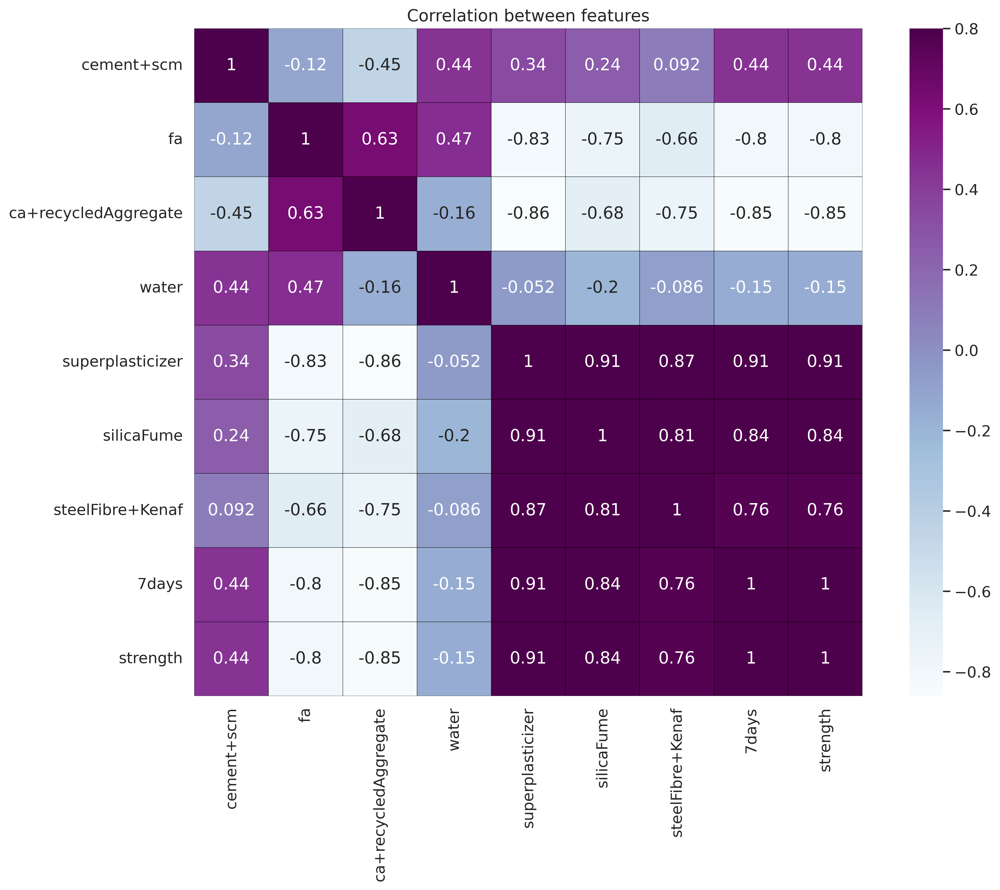

In [ ]:
#heatmap
sns.set(font_scale=1.15)
plt.figure(figsize=(14, 10))

sns.heatmap(cor, vmax=.8, linewidths=0.01,
            square=True,annot=True,cmap="BuPu",linecolor="black")
plt.title('Correlation between features');

In [ ]:
#strength vs cement

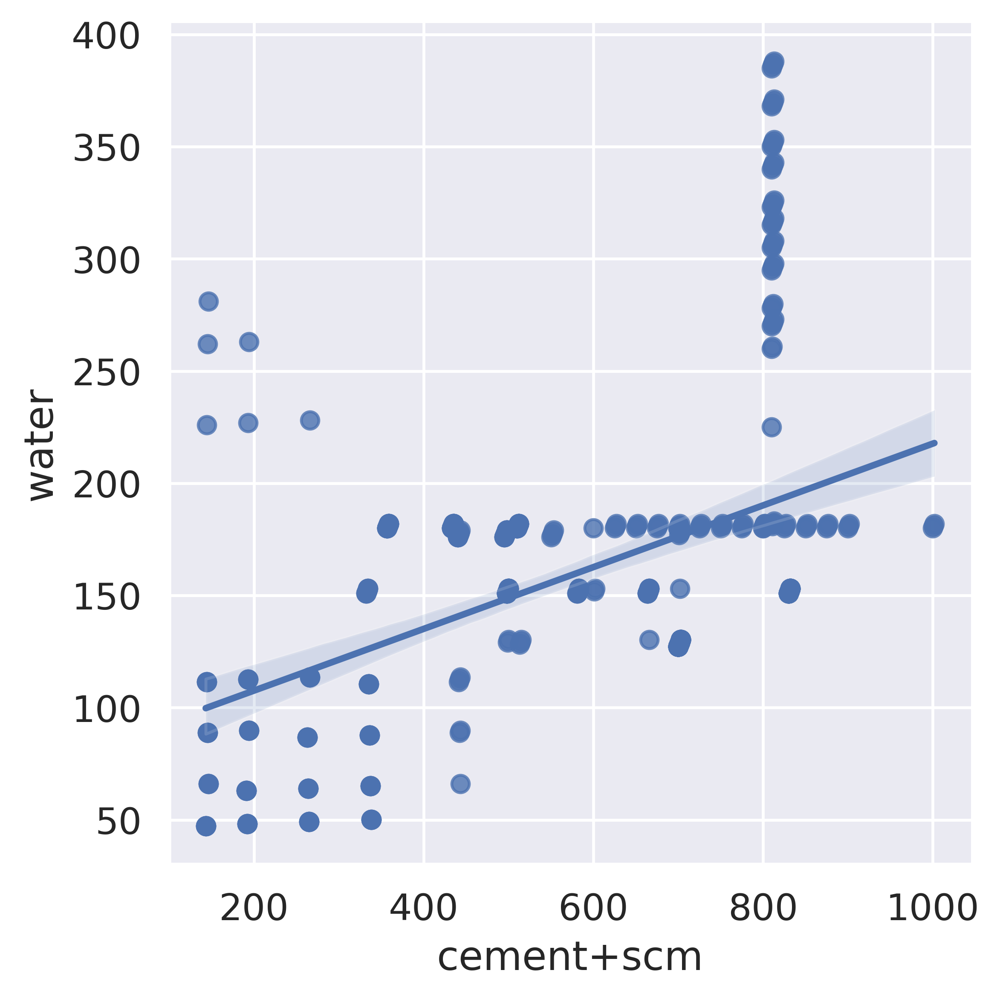

In [ ]:
# water vs cement
#lm plot
sns.lmplot(x="cement+scm",y="water",data=concrete_df)
plt.show()

## 3.3. Strategies to handle different data challenges

## Checking for Missing Values

In [ ]:
#Checking for missing values
concrete_df.isnull().sum()

cement+scm              0
fa                      0
ca+recycledAggregate    0
water                   0
superplasticizer        0
silicaFume              0
steelFibre+Kenaf        0
7days                   0
strength                0
dtype: int64

* We can see that there are no missing values.

## Checking for outliers

In [ ]:
#Creating copy of original dataset
concrete_df1=concrete_df.copy()

In [ ]:
# again check for outliers in dataset after handling missing values using boxplot
concrete_df1.boxplot(figsize=(35,15))

<Axes: >

In [ ]:
#Records which contains the outliers in water attribute
print('Records containing outliers in water: \n',concrete_df1[((concrete_df1.water - concrete_df1.water.mean()) / concrete_df1.water.std()).abs() >3]['water'])

Records containing outliers in water: 
 63     368.0
64     385.0
192    369.0
193    386.0
321    370.0
322    387.0
449    353.0
450    371.0
451    388.0
Name: water, dtype: float64


## Handling the outliers

In [ ]:
#Replacing the outliers by median
for col_name in concrete_df1.columns[:-1]:
    q1 = concrete_df1[col_name].quantile(0.25)
    q3 = concrete_df1[col_name].quantile(0.75)
    iqr = q3 - q1

    low = q1-1.5*iqr
    high = q3+1.5*iqr
    concrete_df1.loc[(concrete_df1[col_name] < low) | (concrete_df1[col_name] > high), col_name] = concrete_df1[col_name].median()

In [ ]:
# again check for outliers in dataset using boxplot
concrete_df1.boxplot(figsize=(35,15))

<Axes: >

# 4. Feature Engineering, Model Building and Model Tuning

### Scaling the features

In [ ]:
#Scaling the dataset
concrete_df_z = concrete_df1.apply(zscore)
concrete_df_z=pd.DataFrame(concrete_df_z,columns=concrete_df.columns)

* Here, all the attributes in the same scale(unit) except the age attribute. Hence, we are scaling the attributes. We are using zscore for scaling.

## Splitting the data into independent and dependent attributes

In [ ]:
#independent and dependent variables
X=concrete_df_z.iloc[:,0:8]
y = concrete_df_z.iloc[:,8]

## Splitting the data into three sets

In [ ]:
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 2)
X_train

,cement+scm,fa,ca+recycledAggregate,water,superplasticizer,silicaFume,steelFibre+Kenaf,7days
327,-0.384206,0.423232,0.241257,1.056537,-1.037316,-0.633674,1.845633,-0.698789
175,-1.245065,0.587030,1.515238,-1.803725,-1.365820,-0.651119,0.081509,-1.209181
232,1.176102,-2.518312,-1.439690,0.145722,0.288228,3.692637,0.002798,1.772684
94,0.657630,-0.984409,-1.046437,0.995816,0.806919,-0.668563,-0.715595,0.467081
194,1.078277,0.423232,0.294340,1.026177,-1.383110,-0.651119,-0.653126,-0.881874
...,...,...,...,...,...,...,...,...
299,-1.944513,0.604093,1.519662,-1.051999,-1.195228,-0.633674,0.143978,-1.074458
22,0.535348,0.372045,0.288147,-0.607522,0.288228,1.163141,-0.059671,0.280542
72,-1.142349,0.423232,0.232410,0.995816,-1.267845,-0.668563,1.720695,-0.902600
15,0.535348,0.372045,0.288147,-0.607522,0.288228,1.163141,-0.059671,0.327177


## DecisionTree Regression

In [ ]:
dt_model = DecisionTreeRegressor()
dt_model.fit(X_train , y_train)

DecisionTreeRegressor()

In [ ]:
#printing the feature importance
print('Feature importances: \n',pd.DataFrame(dt_model.feature_importances_,columns=['Imp'],index=X_train.columns))

Feature importances: 
                            Imp
cement+scm            0.000004
fa                    0.000002
ca+recycledAggregate  0.000093
water                 0.000005
superplasticizer      0.000006
silicaFume            0.000568
steelFibre+Kenaf      0.000001
7days                 0.999321


In [ ]:
y_pred = dt_model.predict(X_test)
# performance on train data
print('Performance on training data using DT:',dt_model.score(X_train,y_train))
# performance on test data
print('Performance on testing data using DT:',dt_model.score(X_test,y_test))
#Evaluate the model using accuracy
acc_DT=metrics.r2_score(y_test, y_pred)
print('Accuracy DT: ',acc_DT)
print('MSE: ',metrics.mean_squared_error(y_test, y_pred))

Performance on training data using DT: 1.0
Performance on testing data using DT: 0.9999197345592734
Accuracy DT:  0.9999197345592734
MSE:  6.78111143891762e-05


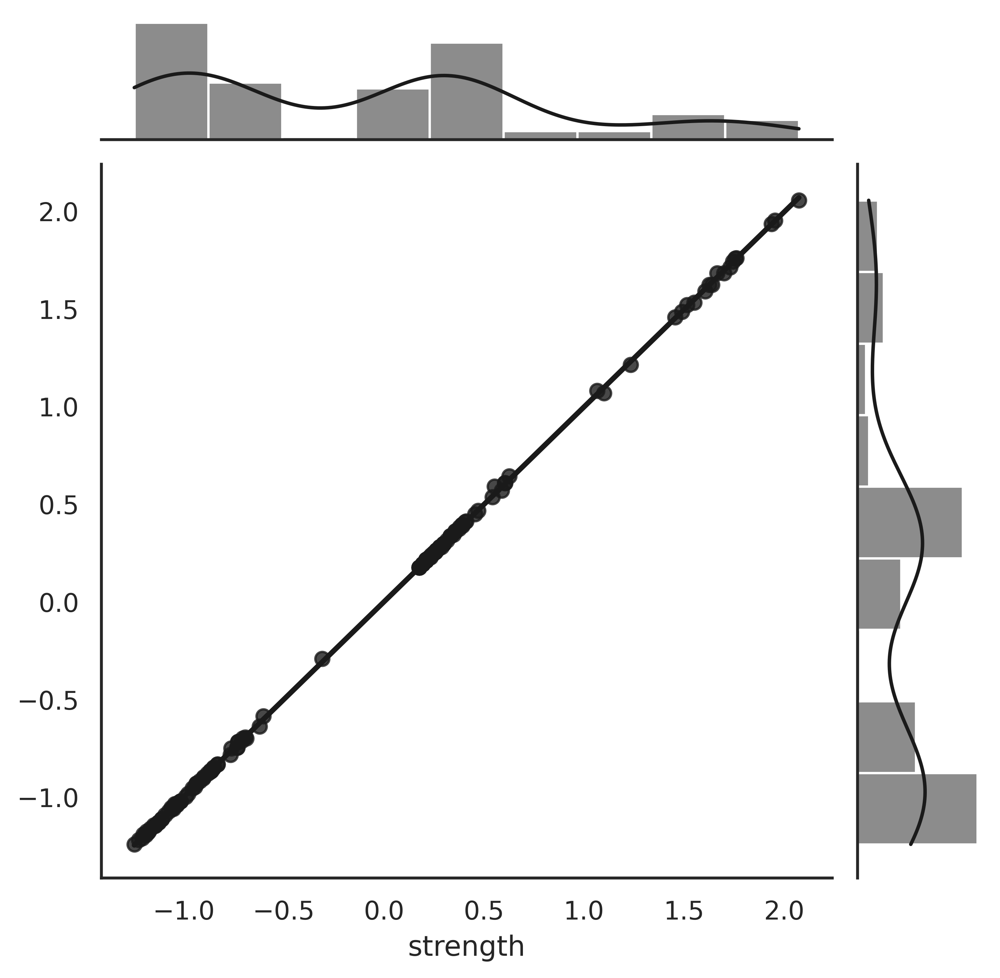

In [ ]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)
with sns.axes_style("white"):
    sns.jointplot(x=y_test, y=y_pred, data=pearsonr,kind="reg", color="k");

In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison
results = pd.DataFrame({'Method':['Decision Tree'], 'accuracy': acc_DT})
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.99992


### K fold cross validation

In [ ]:
num_folds = 10
seed = 77
kfold = KFold(n_splits=num_folds)
results1 = cross_val_score(dt_model,X, y, cv=kfold)
accuracy=np.mean(abs(results1))
print('Average accuracy: ',accuracy)
print('Standard Deviation: ',results1.std())

Average accuracy:  0.9988836767371267
Standard Deviation:  0.0026031724741199256


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Decision Tree k fold'], 'accuracy': [accuracy]})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.999920
0,Decision Tree k fold,0.998884


### Iteration 2

### Drop the least significant variable

In [ ]:
concrete_df_z.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 453 entries, 0 to 452
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   cement+scm            453 non-null    float64
 1   fa                    453 non-null    float64
 2   ca+recycledAggregate  453 non-null    float64
 3   water                 453 non-null    float64
 4   superplasticizer      453 non-null    float64
 5   silicaFume            453 non-null    float64
 6   steelFibre+Kenaf      453 non-null    float64
 7   7days                 453 non-null    float64
 8   strength              453 non-null    float64
dtypes: float64(9)
memory usage: 32.0 KB


In [ ]:
#Create a copy of the dataset
concrete_df2=concrete_df_z.copy()

In [ ]:
#independent and dependent variable
X = concrete_df2.drop( ['strength','ca+recycledAggregate','fa','7days'] , axis=1)
y = concrete_df2['strength']
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 1)

In [ ]:
dt_model = DecisionTreeRegressor()
dt_model.fit(X_train , y_train)

DecisionTreeRegressor()

In [ ]:
#printing the feature importance
print('Feature importances: \n',pd.DataFrame(dt_model.feature_importances_,columns=['Imp'],index=X_train.columns))

Feature importances: 
                        Imp
cement+scm        0.024700
water             0.117105
superplasticizer  0.740438
silicaFume        0.115312
steelFibre+Kenaf  0.002445


In [ ]:
y_pred = dt_model.predict(X_test)
# performance on train data
print('Performance on training data using DT:',dt_model.score(X_train,y_train))
# performance on test data
print('Performance on testing data using DT:',dt_model.score(X_test,y_test))
#Evaluate the model using accuracy
acc_DT=metrics.r2_score(y_test, y_pred)
print('Accuracy DT: ',acc_DT)

Performance on training data using DT: 0.9909056193258851
Performance on testing data using DT: 0.939463998641864
Accuracy DT:  0.939463998641864


* The acuracy on testing dataset is not improved, still it is an overfit model.

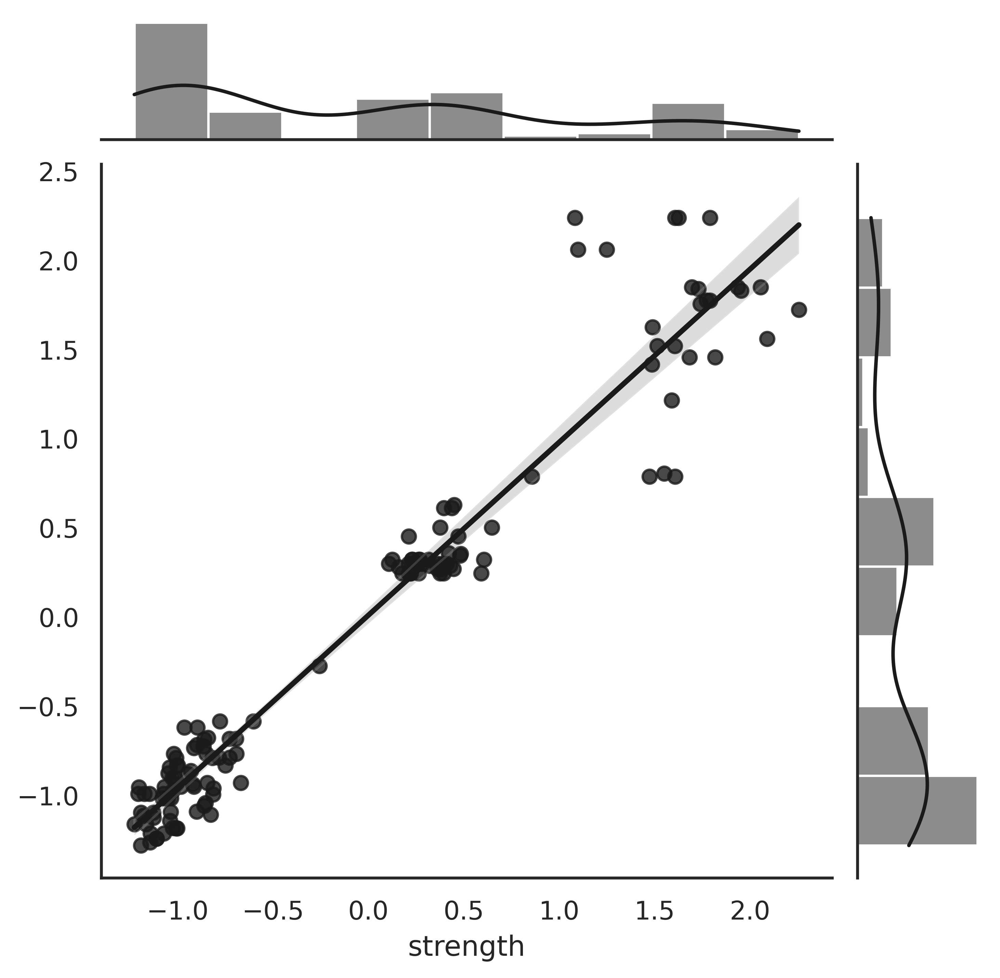

In [ ]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)
with sns.axes_style("white"):
    sns.jointplot(x=y_test, y=y_pred, data=pearsonr,kind="reg", color="k");

In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Decision Tree2'], 'accuracy': [acc_DT]})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results


,Method,accuracy
0,Decision Tree,0.999920
0,Decision Tree k fold,0.998884
0,Decision Tree2,0.939464


## Regularising/Pruning of Decision Tree

In [ ]:
#independent and dependent variables
X=concrete_df_z.iloc[:,0:8]
y = concrete_df_z.iloc[:,8]
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 1)

In [ ]:
# Regularizing the Decision tree classifier and fitting the model
reg_dt_model = DecisionTreeRegressor( max_depth = 4,random_state=1,min_samples_leaf=5)
reg_dt_model.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=4, min_samples_leaf=5, random_state=1)

In [ ]:
print (pd.DataFrame(reg_dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                      Imp
cement+scm            0.0
fa                    0.0
ca+recycledAggregate  0.0
water                 0.0
superplasticizer      0.0
silicaFume            0.0
steelFibre+Kenaf      0.0
7days                 1.0


### Visualizing the Regularized Tree

In [ ]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus
import graphviz
bank_df=concrete_df_z
xvar = bank_df.drop('strength', axis=1)
feature_cols = xvar.columns

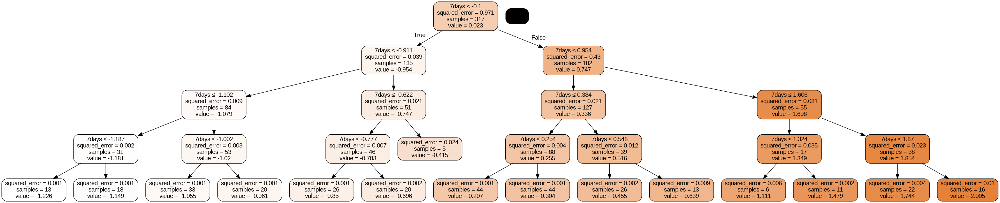

In [ ]:
dot_data = StringIO()
export_graphviz(reg_dt_model, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('concrete_pruned.png')
Image(graph.create_png())

In [ ]:
y_pred = reg_dt_model.predict(X_test)
# performance on train data
print('Performance on training data using DT:',reg_dt_model.score(X_train,y_train))
# performance on test data
print('Performance on testing data using DT:',reg_dt_model.score(X_test,y_test))
#Evaluate the model using accuracy
acc_RDT=metrics.r2_score(y_test, y_pred)
print('Accuracy DT: ',acc_RDT)
print('MSE: ',metrics.mean_squared_error(y_test, y_pred))

Performance on training data using DT: 0.9972792980618693
Performance on testing data using DT: 0.9968217023461451
Accuracy DT:  0.9968217023461451
MSE:  0.0033793851661213744


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Pruned Decision Tree'], 'accuracy': [acc_RDT]})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.999920
0,Decision Tree k fold,0.998884
0,Decision Tree2,0.939464
0,Pruned Decision Tree,0.996822


### K fold cross validation

In [ ]:
num_folds = 10
seed = 77
kfold = KFold(n_splits=num_folds)
results1 = cross_val_score(reg_dt_model,X, y, cv=kfold)
accuracy=np.mean(abs(results1))
print('Average accuracy: ',accuracy)
print('Standard Deviation: ',results1.std())

Average accuracy:  0.9930218826132828
Standard Deviation:  0.003654057747331877


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Pruned Decision Tree k fold'], 'accuracy': [accuracy]})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

# K Means Clustering

In [ ]:
cluster_range = range( 1, 15 )
cluster_errors = []
for num_clusters in cluster_range:
  clusters = KMeans( num_clusters, n_init = 5)
  clusters.fit(concrete_df1)
  labels = clusters.labels_
  centroids = clusters.cluster_centers_
  cluster_errors.append( clusters.inertia_ )
clusters_df = pd.DataFrame( { "num_clusters":cluster_range, "cluster_errors": cluster_errors } )
clusters_df[0:15]

,num_clusters,cluster_errors
0,1,4.803382e+07
1,2,2.589301e+07
2,3,1.367653e+07
3,4,9.365048e+06
4,5,6.601382e+06
5,6,5.529922e+06
6,7,5.030313e+06
7,8,4.324620e+06
8,9,3.881512e+06
9,10,3.426203e+06


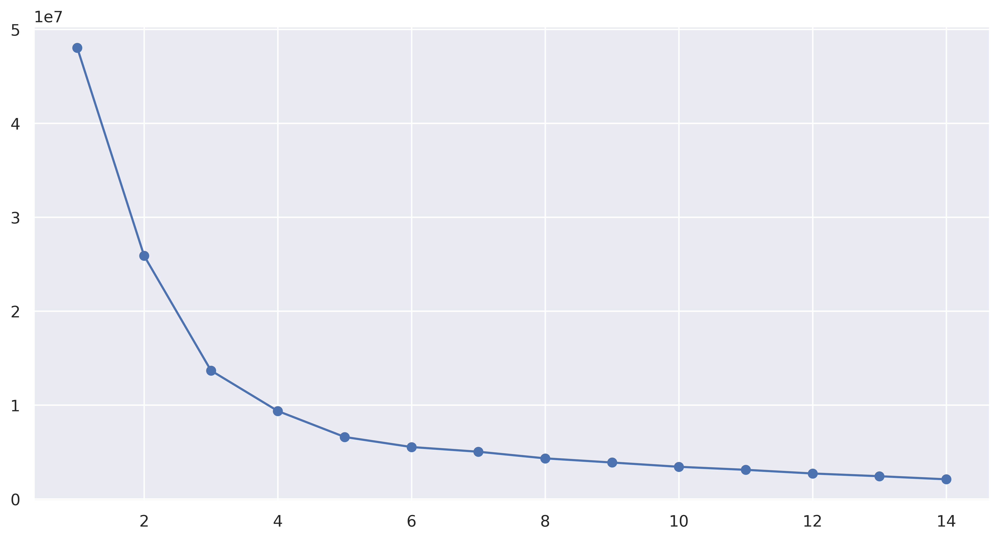

In [ ]:
# Elbow plot
plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )

In [ ]:
# k=6
cluster = KMeans( n_clusters = 6, random_state = 2354 )
cluster.fit(concrete_df_z)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=6, random_state=2354)

In [ ]:
# Creating a new column "GROUP" which will hold the cluster id of each record
prediction=cluster.predict(concrete_df_z)
concrete_df_z["GROUP"] = prediction
# Creating a mirror copy for later re-use instead of building repeatedly
concrete_df_z_copy = concrete_df_z.copy(deep = True)

In [ ]:
centroids = cluster.cluster_centers_
centroids

array([[ 5.12541571e-01, -3.16181332e-01, -1.29991143e+00,
         6.36785842e-01,  7.04386803e-01, -6.36919293e-01,
        -3.63298956e-01,  8.33819495e-01,  8.33819495e-01],
       [ 1.71459141e-01,  5.42094039e-01,  5.18451332e-01,
         7.09946753e-01, -6.44274671e-01, -6.44036997e-01,
        -6.27243368e-01, -8.86251691e-01, -8.86251691e-01],
       [-1.63866192e+00,  5.90339503e-01,  1.48661925e+00,
        -1.63752473e+00, -1.21398501e+00, -6.41867519e-01,
        -2.63772917e-01, -1.10185300e+00, -1.10185300e+00],
       [-7.02544256e-01,  4.23232172e-01,  5.10445935e-02,
         1.02617693e+00, -1.06613189e+00, -6.51118550e-01,
         3.00130896e+00, -8.85903967e-01, -8.85903967e-01],
       [ 4.98707756e-01,  3.97638692e-01,  2.94781966e-01,
        -5.61980940e-01,  4.61124772e-01,  1.18930800e+00,
         3.40327653e-02,  2.88808144e-01,  2.88808144e-01],
       [ 3.11385825e-01, -2.42873466e+00, -1.41425495e+00,
         1.46306224e-01,  1.37215886e+00,  1.008150

In [ ]:
centroid_df = pd.DataFrame(centroids, columns = list(concrete_df1) )
centroid_df

,cement+scm,fa,ca+recycledAggregate,water,superplasticizer,silicaFume,steelFibre+Kenaf,7days,strength
0,0.512542,-0.316181,-1.299911,0.636786,0.704387,-0.636919,-0.363299,0.833819,0.833819
1,0.171459,0.542094,0.518451,0.709947,-0.644275,-0.644037,-0.627243,-0.886252,-0.886252
2,-1.638662,0.590340,1.486619,-1.637525,-1.213985,-0.641868,-0.263773,-1.101853,-1.101853
3,-0.702544,0.423232,0.051045,1.026177,-1.066132,-0.651119,3.001309,-0.885904,-0.885904
4,0.498708,0.397639,0.294782,-0.561981,0.461125,1.189308,0.034033,0.288808,0.288808
5,0.311386,-2.428735,-1.414255,0.146306,1.372159,1.008150,0.002798,1.732140,1.732140


array([[<Axes: title={'center': '7days'}, xlabel='[GROUP]'>,
        <Axes: title={'center': 'ca+recycledAggregate'}, xlabel='[GROUP]'>,
        <Axes: title={'center': 'cement+scm'}, xlabel='[GROUP]'>],
       [<Axes: title={'center': 'fa'}, xlabel='[GROUP]'>,
        <Axes: title={'center': 'silicaFume'}, xlabel='[GROUP]'>,
        <Axes: title={'center': 'steelFibre+Kenaf'}, xlabel='[GROUP]'>],
       [<Axes: title={'center': 'strength'}, xlabel='[GROUP]'>,
        <Axes: title={'center': 'superplasticizer'}, xlabel='[GROUP]'>,
        <Axes: title={'center': 'water'}, xlabel='[GROUP]'>]],
      dtype=object)

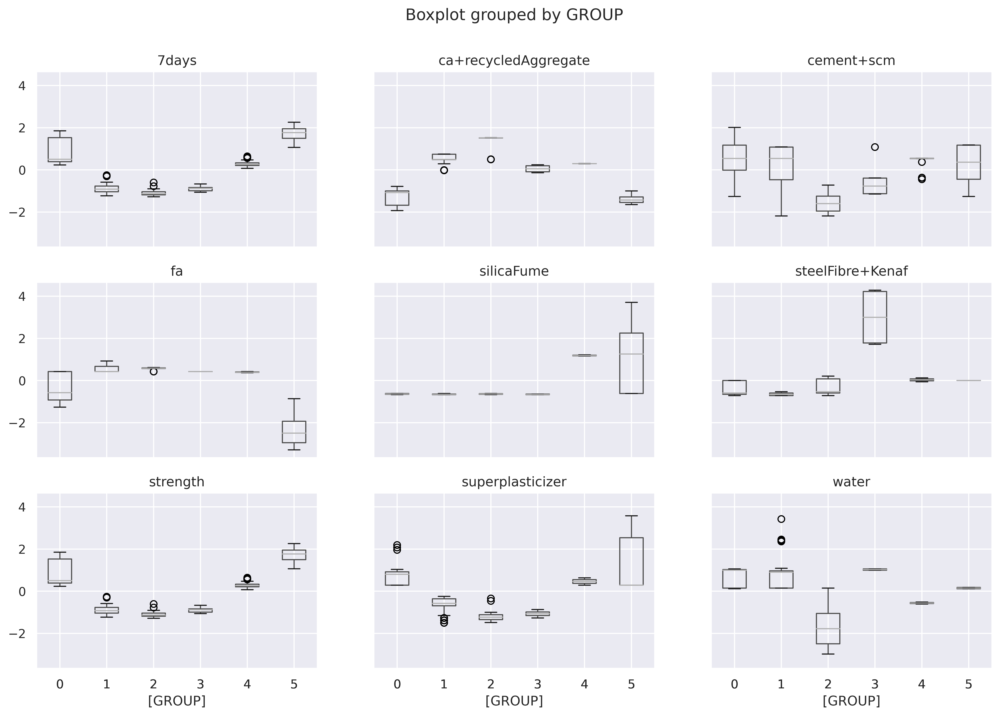

In [ ]:
## Instead of interpreting the neumerical values of the centroids, let us do a visual analysis by converting the
## centroids and the data in the cluster into box plots.
import matplotlib.pylab as plt
concrete_df_z.boxplot(by = 'GROUP',  layout=(3,3), figsize=(15, 10))

In [ ]:
#independent and dependent variables
X=concrete_df_z.iloc[:,0:8]
y = concrete_df_z.iloc[:,8]
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 1)

## Random Forest Regressor

In [ ]:
model=RandomForestRegressor()
model.fit(X_train, y_train)

RandomForestRegressor()

In [ ]:
y_pred = model.predict(X_test)
# performance on train data
print('Performance on training data using RFR:',model.score(X_train,y_train))
# performance on test data
print('Performance on testing data using RFR:',model.score(X_test,y_test))
#Evaluate the model using accuracy
acc_RFR=metrics.r2_score(y_test, y_pred)
print('Accuracy DT: ',acc_RFR)
print('MSE: ',metrics.mean_squared_error(y_test, y_pred))

Performance on training data using RFR: 0.9999370421167529
Performance on testing data using RFR: 0.9998296183765363
Accuracy DT:  0.9998296183765363
MSE:  0.0001811614875701501


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Random Forest Regressor'], 'accuracy': [acc_RFR]})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.999920
0,Decision Tree k fold,0.998884
0,Decision Tree2,0.939464
0,Pruned Decision Tree,0.996822
0,Random Forest Regressor,0.999830


### K fold cross validation

In [ ]:
num_folds = 10
seed = 77
kfold = KFold(n_splits=num_folds)
results1 = cross_val_score(model,X, y, cv=kfold)
accuracy=np.mean(abs(results1))
print('Average accuracy: ',accuracy)
print('Standard Deviation: ',results1.std())

Average accuracy:  0.9995773546812066
Standard Deviation:  0.0006449257121415012


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Random Forest Regressor k fold'], 'accuracy': [accuracy]})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.999920
0,Decision Tree k fold,0.998884
0,Decision Tree2,0.939464
0,Pruned Decision Tree,0.996822
0,Random Forest Regressor,0.999830
0,Random Forest Regressor k fold,0.999577


## Gradient Boosting Regressor

In [ ]:
model=GradientBoostingRegressor()
model.fit(X_train, y_train)

GradientBoostingRegressor()

In [ ]:
y_pred = model.predict(X_test)
# performance on train data
print('Performance on training data using GBR:',model.score(X_train,y_train))
# performance on test data
print('Performance on testing data using GBR:',model.score(X_test,y_test))
#Evaluate the model using accuracy
acc_GBR=metrics.r2_score(y_test, y_pred)
print('Accuracy DT: ',acc_GBR)
print('MSE: ',metrics.mean_squared_error(y_test, y_pred))

Performance on training data using GBR: 0.9999935132032849
Performance on testing data using GBR: 0.9999260225893482
Accuracy DT:  0.9999260225893482
MSE:  7.865788274476974e-05


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Gradient Boost Regressor'], 'accuracy': [acc_GBR]})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.999920
0,Decision Tree k fold,0.998884
0,Decision Tree2,0.939464
0,Pruned Decision Tree,0.996822
0,Random Forest Regressor,0.999830
0,Random Forest Regressor k fold,0.999577
0,Gradient Boost Regressor,0.999926


### K fold cross validation

In [ ]:
num_folds = 10
seed = 77
kfold = KFold(n_splits=num_folds)
results1 = cross_val_score(model,X, y, cv=kfold)
accuracy=np.mean(abs(results1))
print('Average accuracy: ',accuracy)
print('Standard Deviation: ',results1.std())

Average accuracy:  0.9996968589278536
Standard Deviation:  0.0005131924715657444


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Gradient Boost Regressor k fold'], 'accuracy': [accuracy]})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.999920
0,Decision Tree k fold,0.998884
0,Decision Tree2,0.939464
0,Pruned Decision Tree,0.996822
0,Random Forest Regressor,0.999830
0,Random Forest Regressor k fold,0.999577
0,Gradient Boost Regressor,0.999926
0,Gradient Boost Regressor k fold,0.999697


# K Nearest Neighbor (KNN)

In [ ]:
error=[]
for i in range(1,30):
    knn = KNeighborsRegressor(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error.append(np.mean(pred_i!=y_test))

Text(0, 0.5, 'Mean error')

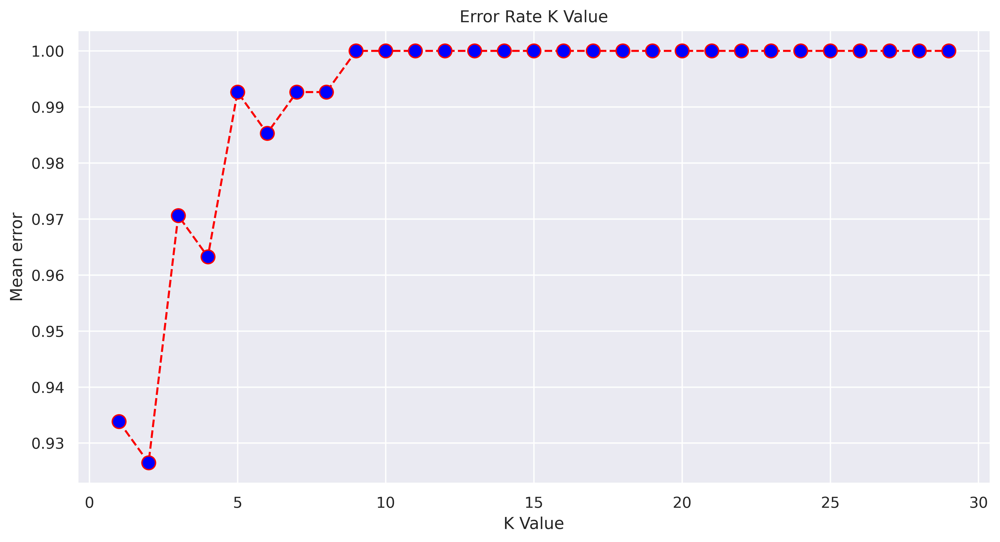

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(range(1,30),error,color='red', linestyle='dashed',marker='o',markerfacecolor='blue',markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean error')

In [ ]:
#k=3
model = KNeighborsRegressor(n_neighbors=3)
model.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=3)

In [ ]:
y_pred = model.predict(X_test)
# performance on train data
print('Performance on training data using KNNR:',model.score(X_train,y_train))
# performance on test data
print('Performance on testing data using KNNR:',model.score(X_test,y_test))
#Evaluate the model using accuracy
acc_K=metrics.r2_score(y_test, y_pred)
print('Accuracy KNNR: ',acc_K)
print('MSE: ',metrics.mean_squared_error(y_test, y_pred))

Performance on training data using KNNR: 0.9943653172368238
Performance on testing data using KNNR: 0.9916992700035965
Accuracy KNNR:  0.9916992700035965
MSE:  0.008825908354996873


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['KNN Regressor'], 'accuracy': [acc_K]})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.999920
0,Decision Tree k fold,0.998884
0,Decision Tree2,0.939464
0,Pruned Decision Tree,0.996822
0,Random Forest Regressor,0.999830
0,Random Forest Regressor k fold,0.999577
0,Gradient Boost Regressor,0.999926
0,Gradient Boost Regressor k fold,0.999697
0,KNN Regressor,0.991699


### K fold cross validation

In [ ]:
num_folds = 10
seed = 77
kfold = KFold(n_splits=num_folds)
results1 = cross_val_score(model,X, y, cv=kfold)
accuracy=np.mean(abs(results1))
print('Average accuracy: ',accuracy)
print('Standard Deviation: ',results1.std())

Average accuracy:  0.9750707641008723
Standard Deviation:  0.01730682182171799


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['KNN Regressor k fold'], 'accuracy': [accuracy]})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.999920
0,Decision Tree k fold,0.998884
0,Decision Tree2,0.939464
0,Pruned Decision Tree,0.996822
0,Random Forest Regressor,0.999830
0,Random Forest Regressor k fold,0.999577
0,Gradient Boost Regressor,0.999926
0,Gradient Boost Regressor k fold,0.999697
0,KNN Regressor,0.991699
0,KNN Regressor k fold,0.975071


## Bootstrap Sampling

In [ ]:
concrete_XY = X.join(y)

### Using Gradient Boosting Regressor

In [ ]:
values = concrete_XY.values
# Number of bootstrap samples to create
n_iterations = 1000
# size of a bootstrap sample
n_size = int(len(concrete_df_z) * 1)

# run bootstrap
# empty list that will hold the scores for each bootstrap iteration
stats = list()
for i in range(n_iterations):
    # prepare train and test sets
    train = resample(values, n_samples=n_size)  # Sampling with replacement
    test = np.array([x for x in values if x.tolist() not in train.tolist()])  # picking rest of the data not considered in sample


     # fit model
    gbmTree = GradientBoostingRegressor(n_estimators=50)
    # fit against independent variables and corresponding target values
    gbmTree.fit(train[:,:-1], train[:,-1])
    # Take the target column for all rows in test set

    y_test = test[:,-1]
    # evaluate model
    # predict based on independent variables in the test data
    score = gbmTree.score(test[:, :-1] , y_test)
    predictions = gbmTree.predict(test[:, :-1])

    stats.append(score)

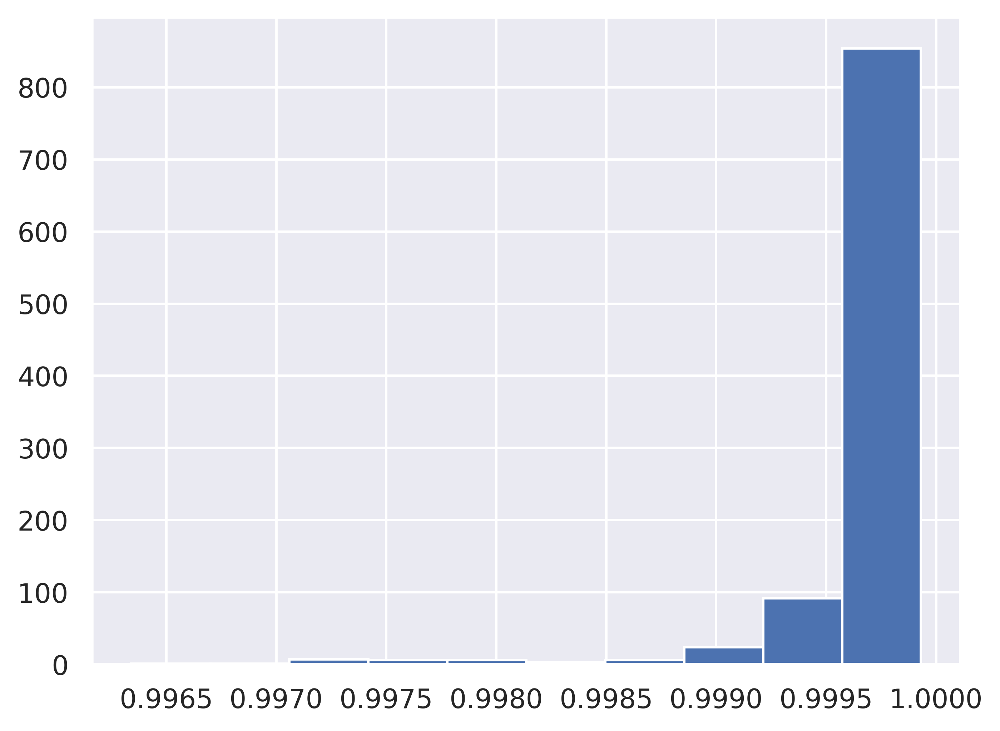

95.0 confidence interval 99.9% and 100.0%


In [ ]:
# plot scores

from matplotlib import pyplot
pyplot.hist(stats)
pyplot.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(stats, p))
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(stats, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

### Using Random Forest Regressor

In [ ]:
values = concrete_XY.values
# Number of bootstrap samples to create
n_iterations = 1000
# size of a bootstrap sample
n_size = int(len(concrete_df_z) * 1)

# run bootstrap
# empty list that will hold the scores for each bootstrap iteration
stats = list()
for i in range(n_iterations):
    # prepare train and test sets
    train = resample(values, n_samples=n_size)  # Sampling with replacement
    test = np.array([x for x in values if x.tolist() not in train.tolist()])  # picking rest of the data not considered in sample


     # fit model
    rfTree = RandomForestRegressor(n_estimators=100)
    # fit against independent variables and corresponding target values
    rfTree.fit(train[:,:-1], train[:,-1])
    # Take the target column for all rows in test set

    y_test = test[:,-1]
    # evaluate model
    # predict based on independent variables in the test data
    score = rfTree.score(test[:, :-1] , y_test)
    predictions = rfTree.predict(test[:, :-1])

    stats.append(score)

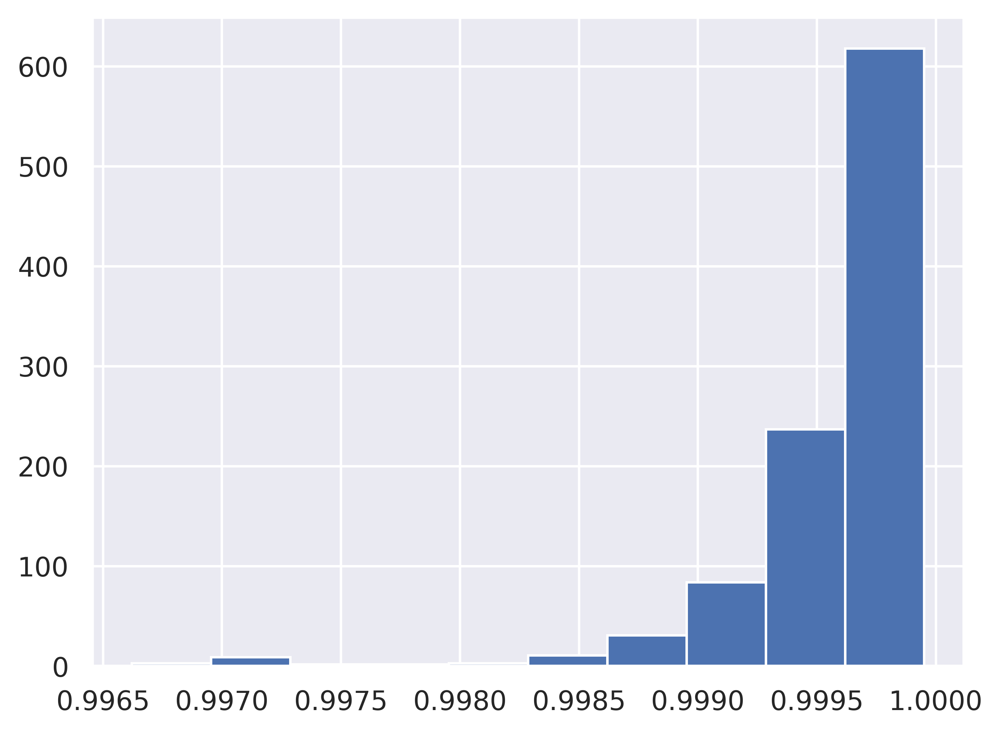

95.0 confidence interval 99.9% and 100.0%


In [ ]:
# plot scores

from matplotlib import pyplot
pyplot.hist(stats)
pyplot.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(stats, p))
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(stats, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

The bootstrap random forest  classification model performance is between 84%-90.8% which is better than other classification algorithms.